### 1. Data extraction

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_jan_june_15 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-janjune-15.csv")

In [3]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [4]:
df_jan_june_15.shape

(14270479, 4)

In [5]:
df_jan_june_15.shape[0]/1000000

14.270479

In [6]:
df_jan_june_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


In [7]:
df_jan_june_15["Pickup_date"] = pd.to_datetime(df_jan_june_15["Pickup_date"])

In [8]:
df_jan_june_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Dispatching_base_num  object        
 1   Pickup_date           datetime64[ns]
 2   Affiliated_base_num   object        
 3   locationID            int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 435.5+ MB


In [9]:
df_jan_june_15[df_jan_june_15["Dispatching_base_num"] != df_jan_june_15["Affiliated_base_num"]].shape[0]/1000000 ## to check Dispatching_base_num not euqal to Affiliated_base_num.

3.647483

In [10]:
df_jan_june_15[df_jan_june_15["Dispatching_base_num"] != df_jan_june_15["Affiliated_base_num"]].head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
3,B02617,2015-05-17 09:47:00,B02774,80
7,B02617,2015-05-17 09:47:00,B02764,74
9,B02617,2015-05-17 09:47:00,B02764,22
20,B02617,2015-05-17 09:49:00,B02682,242
27,B02617,2015-05-17 09:50:00,B02764,234


In [11]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [12]:
df_jan_june_15[df_jan_june_15.duplicated()].head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
17,B02617,2015-05-17 09:49:00,B02617,237
70,B02617,2015-05-17 09:59:00,B02617,48
77,B02617,2015-05-17 10:00:00,B02617,141
85,B02617,2015-05-17 10:02:00,B02617,237
105,B02617,2015-05-17 10:05:00,B02617,79


In [13]:
df_jan_june_15[df_jan_june_15["locationID"]==237].head() ## ....just to check duplicate values.

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
14,B02617,2015-05-17 09:49:00,B02617,237
17,B02617,2015-05-17 09:49:00,B02617,237
82,B02617,2015-05-17 10:02:00,B02617,237
85,B02617,2015-05-17 10:02:00,B02617,237
141,B02617,2015-05-17 10:10:00,B02617,237


In [14]:
df_jan_june_15.duplicated().sum()

898225

In [15]:
df_jan_june_15.shape

(14270479, 4)

In [16]:
df_jan_june_15.drop_duplicates(inplace = True)

In [17]:
df_jan_june_15.shape

(13372254, 4)

### 2..Which month have max. uber pickups in New York City ?

In [18]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [19]:
df_jan_june_15['Month'] = df_jan_june_15['Pickup_date'].dt.strftime('%B')

In [20]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month
0,B02617,2015-05-17 09:47:00,B02617,141,May
1,B02617,2015-05-17 09:47:00,B02617,65,May
2,B02617,2015-05-17 09:47:00,B02617,100,May
3,B02617,2015-05-17 09:47:00,B02774,80,May
4,B02617,2015-05-17 09:47:00,B02617,90,May


In [21]:
df_jan_june_15.groupby(by=["Month"]).count()[["locationID"]].reset_index()

,Month,locationID
0,April,2112705
1,February,2222189
2,January,1918970
3,June,2571771
4,March,2062639
5,May,2483980


In [22]:
df_pickups = df_jan_june_15.groupby(by=["Month"]).count()[["locationID"]].reset_index()

In [23]:
df_pickups

,Month,locationID
0,April,2112705
1,February,2222189
2,January,1918970
3,June,2571771
4,March,2062639
5,May,2483980


In [24]:
df_pickups.columns = ["month","num_of_pickups"]

In [25]:
df_pickups

,month,num_of_pickups
0,April,2112705
1,February,2222189
2,January,1918970
3,June,2571771
4,March,2062639
5,May,2483980


In [26]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June']

df_pickups['month'] = pd.Categorical(df_pickups['month'], categories=month_order, ordered=True)

df_pickups = df_pickups.sort_values(by='month')


In [27]:
df_pickups

,month,num_of_pickups
2,January,1918970
1,February,2222189
4,March,2062639
0,April,2112705
5,May,2483980
3,June,2571771


In [28]:
df_pickups["num_of_pickups"] = round(df_pickups["num_of_pickups"]/1000000,2)

In [29]:
df_pickups

,month,num_of_pickups
2,January,1.92
1,February,2.22
4,March,2.06
0,April,2.11
5,May,2.48
3,June,2.57


In [30]:
df_pickups = df_pickups.reset_index()

In [31]:
df_pickups = df_pickups.reset_index()

In [32]:
df_pickups.drop(["index"],axis=1,inplace =True)

In [33]:
df_pickups ## num_of_pickups in million i.e ("num_of_pickups"/1000000).

,level_0,month,num_of_pickups
0,0,January,1.92
1,1,February,2.22
2,2,March,2.06
3,3,April,2.11
4,4,May,2.48
5,5,June,2.57


In [34]:
df_pickups

,level_0,month,num_of_pickups
0,0,January,1.92
1,1,February,2.22
2,2,March,2.06
3,3,April,2.11
4,4,May,2.48
5,5,June,2.57


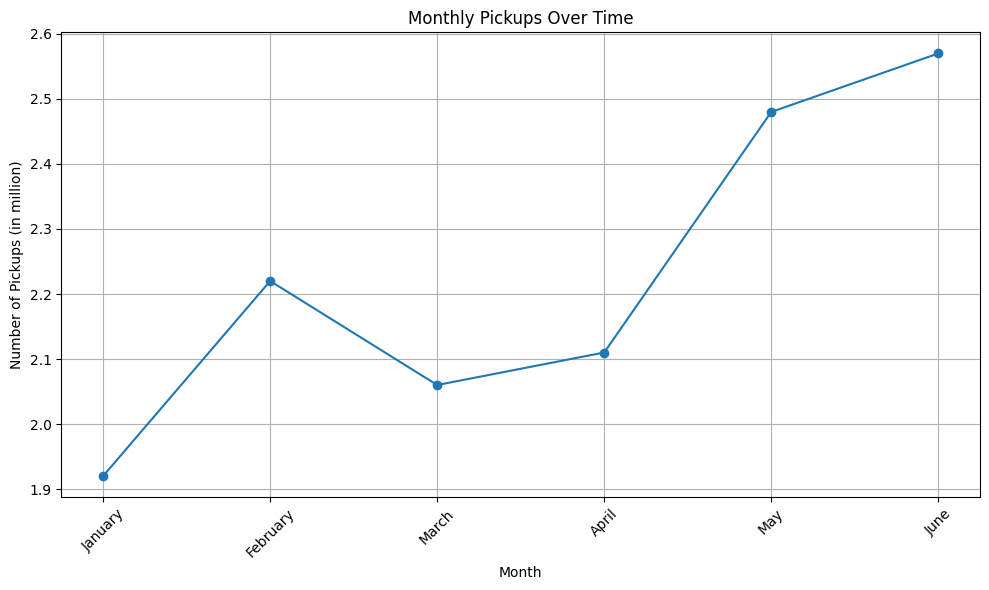

In [35]:

plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
plt.plot(df_pickups['month'], df_pickups['num_of_pickups'], marker='o', linestyle='-')

# Add labels and a title
plt.xlabel('Month')
plt.ylabel('Number of Pickups (in million)')
plt.title('Monthly Pickups Over Time')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Display the chart
plt.grid(True)  # Add gridlines if needed
plt.tight_layout()  # Ensure labels fit within the figure area
plt.show()


Upon observing the graph, it becomes evident that in the month of June, there is a higher number of pickups, totaling 2.5 million, compared to the months from January to May. January, in particular, stands out with a lower pickup count of 1.92 million.

# 3.. Lets Find out Total trips for each month & each weekdays.. 

In [36]:
df_jan_june_15['week_days'] = df_jan_june_15['Pickup_date'].dt.day_name()

In [37]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,week_days
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday


In [38]:
df_trips = df_jan_june_15.groupby(by=["Month","week_days"]).count()[["locationID"]].reset_index()
df_trips

,Month,week_days,locationID
0,April,Friday,315002
1,April,Monday,238429
2,April,Saturday,324545
3,April,Sunday,273560
4,April,Thursday,372522
5,April,Tuesday,250632
6,April,Wednesday,338015
7,February,Friday,373550
8,February,Monday,274948
9,February,Saturday,368311


In [39]:
df_trips.columns = ["Month","week_days","num_of_trips"]

In [40]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June']

df_trips['Month'] = pd.Categorical(df_trips['Month'], categories=month_order, ordered=True)

df_trips = df_trips.sort_values(by='Month')


In [41]:
df_trips["week_days"].unique()

array(['Wednesday', 'Thursday', 'Sunday', 'Saturday', 'Monday', 'Friday',
       'Tuesday'], dtype=object)

In [42]:
df_trips["num_of_trips"] = round(df_trips["num_of_trips"]/100000,2)

In [43]:
df_trips.columns = ["Month","week_days", "num_of_trips(in lakhs)"]


In [44]:
df_trips

,Month,week_days,num_of_trips(in lakhs)
20,January,Wednesday,2.46
18,January,Thursday,3.30
17,January,Sunday,2.30
16,January,Saturday,3.86
15,January,Monday,1.91
14,January,Friday,3.39
19,January,Tuesday,1.97
13,February,Wednesday,2.86
12,February,Tuesday,2.87
11,February,Thursday,3.36


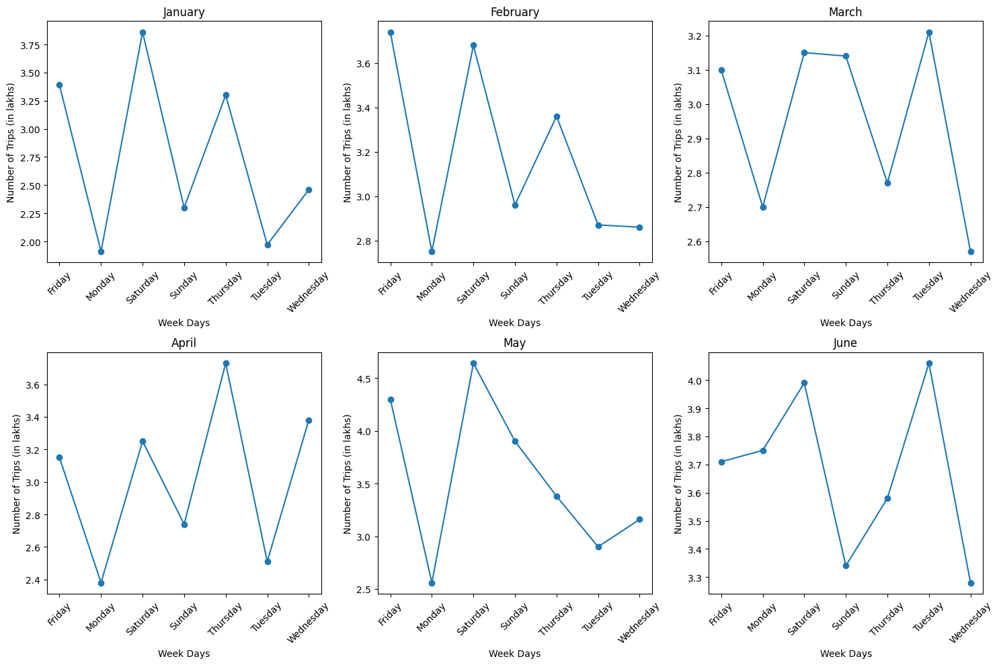

In [45]:

# Create subplots for each month
months = ['January', 'February', 'March', 'April', 'May', 'June']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = np.ravel(axes)

for i, month in enumerate(months):
    ax = axes[i]
    df_month = df_trips[df_trips['Month'] == month]
    df_month = df_month.sort_values(by='week_days')
    
    # Plot the line chart
    ax.plot(df_month['week_days'], df_month['num_of_trips(in lakhs)'], marker='o', linestyle='-')
    
    # Set title and labels
    ax.set_title(month)
    ax.set_xlabel('Week Days')
    ax.set_ylabel('Number of Trips (in lakhs)')
    
    # Rotate x-axis labels for better readability
    ax.tick_params(axis='x', rotation=45)

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


1. In January, the highest number of trips occurs on Saturday, totaling 3.86 lakh, while Monday records the lowest.
2. February sees the peak number of trips on Friday, with 3.74 lakh, and the lowest on Monday.
3. For the month of March, the maximum trips happen on Tuesday, amounting to 3.21 lakh, while Wednesday has the fewest.
4. In April, Thursday stands out with the highest number of trips, reaching 3.73 lakh, and Monday has the fewest.
5. May exhibits the highest number of trips on Saturday, with 4.64 lakh, and the lowest on Monday.
6. June's peak number of trips falls on Tuesday, totaling 4.06 lakh, while Wednesday has the lowest count

# 4.. Lets Find out Hourly Rush in New york city on all days

In [46]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,week_days
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday


In [47]:
df_jan_june_15['hour']=df_jan_june_15['Pickup_date'].dt.hour
df_jan_june_15['weekday']=df_jan_june_15['Pickup_date'].dt.day_name()

In [48]:
df_jan_june_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,week_days,hour,weekday
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday,9,Sunday
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday,9,Sunday
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday,9,Sunday
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday,9,Sunday
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday,9,Sunday


In [49]:
hourly_rush =df_jan_june_15.groupby(['week_days','hour'],as_index=False).size()

In [50]:
hourly_rush.head()

,week_days,hour,size
0,Friday,0,79879
1,Friday,1,44563
2,Friday,2,27252
3,Friday,3,19076
4,Friday,4,23049


<Axes: xlabel='hour', ylabel='size'>

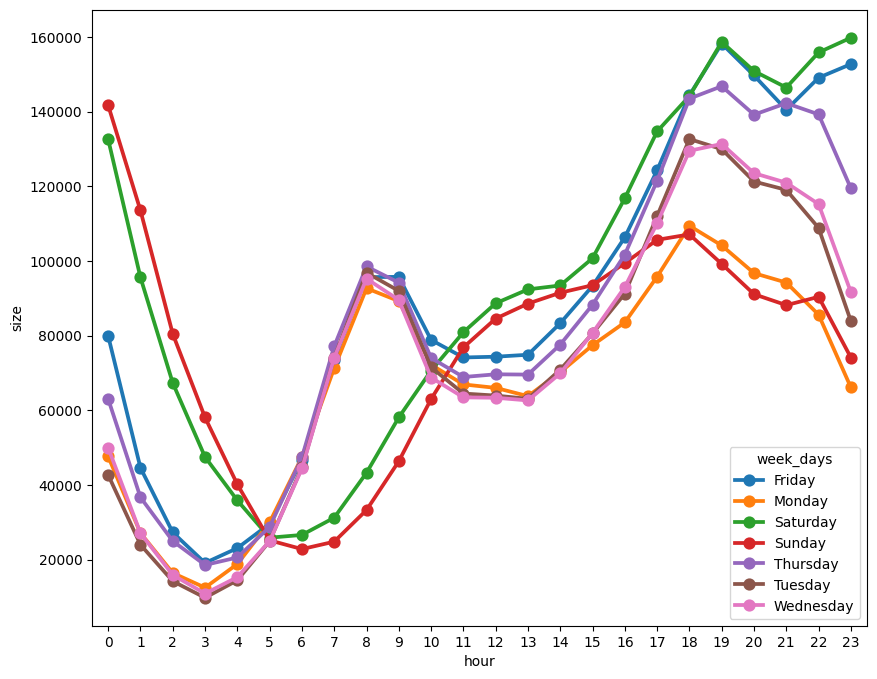

In [51]:
plt.figure(figsize=(10,8))   ## pointplot between 'hour' & 'size' for all the weekdays..
sns.pointplot(x='hour',y='size',hue='week_days',data=hourly_rush)

It's interesting to notice that on Saturday and Sunday, there's a similar demand pattern in the late night, morning, and afternoon. However, during the evening, they go in opposite directions. 

On Saturday, pickups keep going up in the evening, while on Sunday, they start to go down.

We can see that the weekdays with the most demand in the late evening are Friday and Saturday, which makes sense.

Thursday nights also follow a similar pattern to Friday and Saturday nights.

It looks like people in New York are kicking off their 'weekends' on Thursday nights.

## 5. Which Base_number has most number of Active Vehicles ??

In [52]:
df_jan_feb_foil = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\Uber-Jan-Feb-FOIL.csv")

In [53]:
df_jan_feb_foil.shape

(354, 4)

In [54]:
df_jan_feb_foil.duplicated().sum()

0

In [55]:
df_jan_feb_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [56]:
import warnings
warnings.filterwarnings("ignore")

In [57]:
df_active_vehicles = df_jan_feb_foil.groupby(by=["dispatching_base_number"]).sum()[["active_vehicles"]]
df_active_vehicles

,active_vehicles
dispatching_base_number,
B02512,13125
B02598,58653
B02617,79758
B02682,71431
B02764,217290
B02765,22575


<Axes: xlabel='dispatching_base_number'>

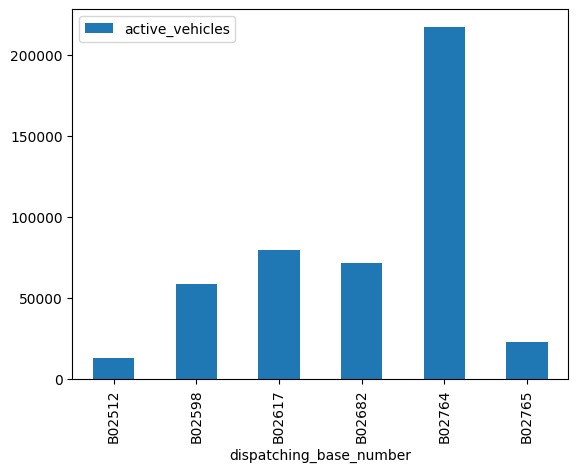

In [58]:
df_active_vehicles.plot(kind= "bar")

The graph reveals that Base Number B02764 has the highest count of active vehicles.

### 6. Collect entire data & Make it ready for the Data Analysis..

In [59]:
df_apr14= pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-apr14.csv")
df_aug14 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-aug14.csv")
df_jul14 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-jul14.csv")
df_jun14 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-jun14.csv")
df_may14 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-may14.csv")
df_sep14 = pd.read_csv(r"F:\AIMS DATA\Analytics\python_data\uber_dataset\uber-raw-data-sep14.csv")

## Dataset Information : 

The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of July 2014 at New York City, USA.

Date/Time : The date and time of the Uber pickup

Lat : The latitude of the Uber pickup

Lon : The longitude of the Uber pickup

Base : The TLC base company code affiliated with the Uber pickup

The Base codes are for the following Uber bases:
B02512 : Unter

B02598 : Hinter

B02617 : Weiter

B02682 : Schmecken

B02764 : Danach-NY

->> The globe is split into an imaginary 360 sections from both top to bottom (north to south) and 180 sections from side to side (west to east). The sections running from top to bottom on a globe are called longitude, and the sections running from side to side on a globe are called latitude.

->> Latitude is the measurement of distance north or south of the Equator.

->> Every location on earth has a global address. Because the address is in numbers, people can communicate about location no matter what language they might speak. A global address is given as two numbers called coordinates. The two numbers are a location's latitude number and its longitude number ("Lat/Long").

In [60]:
df_apr14.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [61]:
df_aug14.head()

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512


In [62]:
import pandas as pd

# Assuming you have dataframes named df_april, df_may, df_june, df_july, df_august, and df_september

# Create a list of dataframes
dataframes = [df_apr14,df_aug14,df_jul14,df_jun14,df_may14,df_sep14]

# Concatenate the dataframes vertically (along the rows)
df_apr_sep_14 = pd.concat(dataframes, ignore_index=True)

# Now, combined_df contains the data from all six dataframes stacked on top of each other


In [63]:
df_apr14.shape[0] + df_aug14.shape[0]+df_jul14.shape[0]+df_jun14.shape[0]+df_may14.shape[0]+df_sep14.shape[0]

4534327

In [64]:
df_apr_sep_14.shape[0]

4534327

In [65]:
df_apr_sep_14.duplicated().sum()

82581

In [66]:
df_apr_sep_14.drop_duplicates(inplace=True)

In [67]:
df_apr_sep_14.shape[0]

4451746

In [68]:
df_apr_sep_14.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


## 7. At what locations of New York City we are getting rush ??

In [69]:
df_rush = df_apr_sep_14.groupby(by=["Lat","Lon"]).count()[["Base"]].reset_index()

In [70]:
df_rush

,Lat,Lon,Base
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [71]:
df_rush.dtypes

Lat     float64
Lon     float64
Base      int64
dtype: object

In [72]:
!pip install folium

In [73]:
import folium

In [74]:
basemap = folium.Map()

In [75]:
from folium.plugins import HeatMap

In [76]:
HeatMap(df_rush).add_to(basemap)

In [77]:
basemap

We can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot.
& these are made from Midtown to Lower Manhattan.
Followed by Upper Manhattan and the Heights of Brooklyn.

In [78]:
m = folium.Map(location=[df_rush['Lat'].mean(), df_rush['Lon'].mean()], zoom_start=12)
for index, row in df_rush.iterrows():
    lat = row['Lat']
    lon = row['Lon']
    base = row['Base']  # Make sure 'base' matches the column name in your DataFrame
    
    # Create a marker with a tooltip
    tooltip = f"Base: {base}"
    folium.Marker([lat, lon], tooltip=tooltip).add_to(m)


## 8. Examine rush on Hour and Weekday ( Perform Pair wise Analysis )

In [79]:
### 19.Pivot Table (Columns,rows(index),values,aggfunction of values)
#### i.syntax-->pd.pivot_table(df , values="Numerical_Column", index=[ "col1,"col2"...],columns=["col"],aggfunc=np.sum ) 
#### aggfunc will be of num col
#### index--> col1-category ,col2-->Subcategory   distinct elements in 2 >= distinct elements in col 1
#### columns--> distinct elements in 3 >=distinct elements in 2 >= distinct elements in col 1

In [80]:
#### ii.For more than 1 num column
#### syntax-->pd.pivot_table(df , values=["ncol1","ncol2"], index=[ "col1,"col2"...],columns=["col"],aggfunc={ncol1:np.sum, ncol2:[np.max,np.min,np.mean] )
#### to perform multiple aggr function on 1 col use [ ]


In [81]:
df_apr_sep_14.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [82]:
df_apr_sep_14['Date/Time']=pd.to_datetime(df_apr_sep_14['Date/Time'],format ='%m/%d/%Y %H:%M:%S')
df_apr_sep_14['weekday']=df_apr_sep_14['Date/Time'].dt.day
df_apr_sep_14['hour']=df_apr_sep_14['Date/Time'].dt.hour

In [83]:
df_apr_sep_14.head()

,Date/Time,Lat,Lon,Base,weekday,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,0


In [84]:
df_apr_sep_14["weekday"].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

In [85]:
df_apr_sep_14["hour"].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [86]:
pivot = pd.pivot_table(df_apr_sep_14 , values=["Base"],index=["weekday"],columns=["hour"],aggfunc=np.count_nonzero)

In [87]:
pivot

Base                                                        ...  \
hour       0     1     2     3     4     5     6     7     8     9   ...   
weekday                                                              ...   
1        3178  1944  1256  1308  1429  2126  3664  5380  5292  4617  ...   
2        2435  1569  1087  1414  1876  2812  4920  6544  6310  4712  ...   
3        3354  2142  1407  1467  1550  2387  4241  5663  5386  4657  ...   
4        2897  1688  1199  1424  1696  2581  4592  6029  5704  4744  ...   
5        2733  1541  1030  1253  1617  2900  4814  6261  6469  5530  ...   
6        4537  2864  1864  1555  1551  2162  3642  4766  4942  4401  ...   
7        3645  2296  1507  1597  1763  2422  4102  5575  5376  4639  ...   
8        2830  1646  1123  1483  1889  3224  5431  7361  7357  5703  ...   
9        2657  1724  1222  1480  1871  3168  5802  7592  7519  5895  ...   
10       3296  2126  1464  1434  1591  2594  4664  6046  6158  5072  ...   
11       3036  1665  1095  1424  1842  2520  4954  6876  6871  5396  ...   
12       3227  2147  1393  1362  1757  2710  4576  6250  6231  5177  ...   
13       5408  3509  2262  1832  1705  2327  4196  5685  6060  5631  ...   
14       3748  2349  1605  1656  1756  2629  4257  5781  5520  4824  ...   
15       2497  1515  1087  1381  1862  2980  5050  6837  6729  5201  ...   
16       2547  1585  1119  1395  1818  2966  5558  7517  7495  5958  ...   
17       3155  2048  1500  1488  1897  2741  4562  6315  5882  4934  ...   
18       3390  2135  1332  1626  1892  2959  4688  6618  6451  5377  ...   
19       3217  2188  1604  1675  1810  2639  4733  6159  6014  5006  ...   
20       4475  3190  2100  1858  1618  2143  3584  4900  5083  4765  ...   
21       4294  3194  1972  1727  1926  2615  4185  5727  5529  4707  ...   
22       2787  1637  1175  1468  1934  3151  5204  6872  6850  5198  ...   
23       2546  1580  1136  1429  1957  3132  5204  6890  6436  5177  ...   
24       3200  2055  1438  1493  1798  2754  4484  6013  5913  5146  ...   
25       2405  1499  1072  1439  1943  2973  5356  7627  7078  5994  ...   
26       3810  3065  2046  1806  1730  2337  3776  5172  5071  4808  ...   
27       5196  3635  2352  2055  1723  2336  3539  4937  5053  4771  ...   
28       4123  2646  1843  1802  1883  2793  4290  5715  5671  5206  ...   
29       2678  1827  1409  1678  1948  3056  5213  6852  6695  5481  ...   
30       2401  1510  1112  1403  1841  3216  5757  7596  7611  6064  ...   
31       2174  1394  1087   919   773   997  1561  2169  2410  2525  ...   

                                                                            
hour       14     15     16     17     18     19     20     21    22    23  
weekday                                                                     
1        6933   7910   8633   9511   8604   8001   7315   7803  6268  4050  
2        6904   8449  10109  11100  11123   9474   8759   8357  6998  5160  
3        7226   8850  10314  10491  11239   9599   9026   8531  7142  4686  
4        7158   8515   9492  10357  10259   9097   8358   8649  7706  5130  
5        6955   8312   9609  10699  10170   9430   9354   9610  8853  6518  
6        7235   8612   9444   9929   9263   8405   8117   8567  7852  5946  
7        7276   8474  10393  11013  10573   9472   8691   8525  7194  4801  
8        7240   8775   9851  10673   9687   8796   8604   8367  6795  4256  
9        7877   9220  10270  11910  11449   9804   8909   8665  7499  5203  
10       7612   9578  11045  11875  10934   9613   9687   9240  7766  5496  
11       7503   8920  10125  10898  10361   9327   8824   8730  7771  5360  
12       7743   9390  10734  11713  12216  10393   9965  10310  9992  7945  
13       8200   9264  10534  11826  11450   9921   8705   8423  7363  5936  
14       6963   8192   9511  10115   9553   9146   9182   8589  6891  4460  
15       7633   8505  10285  11959  11728  11032  10509   9105  7153  4480  
16       7597   9290  10804  11773  10

In [88]:
pivot.style.background_gradient()


By utilizing this pivot table with a background gradient, we can discern the patterns of rush hours and weekdays more effectively. 

### Conclusion:-

- Upon analyzing the graph, it becomes evident that in June, there is a significant increase in pickups, totaling 2.5 million, compared to the preceding months from January to May. Notably, January stands out with a lower pickup count of 1.92 million.

- In January, the highest number of trips occurs on Saturday, totaling 3.86 lakh, while Monday records the lowest count.

- February witnesses the peak number of trips on Friday, with 3.74 lakh, and the lowest on Monday.

- March experiences its maximum trips on Tuesday, amounting to 3.21 lakh, while Wednesday has the fewest.

- April highlights Thursday with the highest number of trips, reaching 3.73 lakh, and Monday with the fewest.

- May demonstrates the highest number of trips on Saturday, totaling 4.64 lakh, and the lowest on Monday.

- June's peak number of trips falls on Tuesday, totaling 4.06 lakh, while Wednesday has the lowest count.

- An intriguing observation is that Saturday and Sunday exhibit a similar demand pattern during the late night, morning, and afternoon. However, during the evening, they display opposite trends.

- On Saturday, pickups continue to increase in the evening, while on Sunday, they begin to decline.

- Notably, Friday and Saturday are the weekdays with the highest demand during the late evening, which aligns with expectations.

- Interestingly, Thursday nights also exhibit a similar pattern to Friday and Saturday nights, suggesting that New Yorkers may commence their 'weekend' activities on Thursday nights.

- The graph indicates that Base Number B02764 boasts the highest count of active vehicles.

- Notably, there are several hot spots visible, particularly in Midtown Manhattan, where activity is notably high.

- Additionally, these hot spots extend from Midtown to Lower Manhattan, demonstrating considerable activity.

- Upper Manhattan and the Heights of Brooklyn also register significant levels of activity.

- Utilizing this pivot table with a background gradient enables us to better discern the patterns of rush hours and weekdays effectively.